In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
%matplotlib inline

/data/tools/miniconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## plot the clustering results for all gene in target samples

In [2]:
df_gene_cluster = pd.read_csv("df_gene_cluster.csv",header=0,index_col=0)
df_gene_cluster.set_index('ENA_name',inplace=True)
df_gene_cluster.head()

,Accession_ID,HORVU.MOREX.r3.1HG0024860,HORVU.MOREX.r3.1HG0031260,HORVU.MOREX.r3.1HG0031480,HORVU.MOREX.r3.1HG0036390,HORVU.MOREX.r3.1HG0054220,HORVU.MOREX.r3.1HG0057440,HORVU.MOREX.r3.1HG0058180,HORVU.MOREX.r3.1HG0062390,HORVU.MOREX.r3.1HG0062680,...,HORVU.MOREX.r3.7HG0699010,HORVU.MOREX.r3.7HG0701130,HORVU.MOREX.r3.7HG0705340,HORVU.MOREX.r3.7HG0721170,HORVU.MOREX.r3.7HG0729460,HORVU.MOREX.r3.7HG0729670,HORVU.MOREX.r3.7HG0740230,HORVU.MOREX.r3.7HG0740600,HORVU.MOREX.r3.7HG0742750,HORVU.MOREX.r3.7HG0751260
ENA_name,,,,,,,,,,,,,,,,,,,,,
ERS2903440,020055-57,mid,mid,low,low,mid,mid,low,high,mid,...,high,low,mid,mid,low,high,high,mid,mid,mid
ERS2903441,02043-20,high,mid,low,mid,high,high,mid,mid,low,...,high,low,mid,mid,mid,high,mid,low,mid,mid
ERS2903442,02055-94,mid,mid,mid,mid,mid,mid,low,mid,mid,...,low,low,mid,low,mid,mid,mid,low,mid,mid
ERS2903444,04053-034,high,mid,low,mid,mid,high,mid,mid,low,...,mid,low,mid,mid,mid,mid,mid,low,low,mid
ERS2903445,04053-099,low,low,mid,high,mid,low,mid,high,high,...,low,low,high,high,mid,low,mid,mid,high,mid


In [3]:
GENES = [col for col in df_gene_cluster.columns if col.startswith("HORVU")]
df_cluster = df_gene_cluster[GENES]
melted_cluster = df_cluster.melt(var_name='gene',value_name='Cluster')
melted_cluster.head()

,gene,Cluster
0,HORVU.MOREX.r3.1HG0024860,mid
1,HORVU.MOREX.r3.1HG0024860,high
2,HORVU.MOREX.r3.1HG0024860,mid
3,HORVU.MOREX.r3.1HG0024860,high
4,HORVU.MOREX.r3.1HG0024860,low


In [4]:
melted_cluster['tmp'] = 1
cluster_count = melted_cluster.groupby(['gene','Cluster']).tmp.agg(['count']).reset_index()
cluster_count.loc[cluster_count['Cluster'] == 'low', 'count'] = -cluster_count['count']
cluster_count.head()

,gene,Cluster,count
0,HORVU.MOREX.r3.1HG0024860,high,129
1,HORVU.MOREX.r3.1HG0024860,low,-133
2,HORVU.MOREX.r3.1HG0024860,mid,240
3,HORVU.MOREX.r3.1HG0031260,high,190
4,HORVU.MOREX.r3.1HG0031260,low,-86


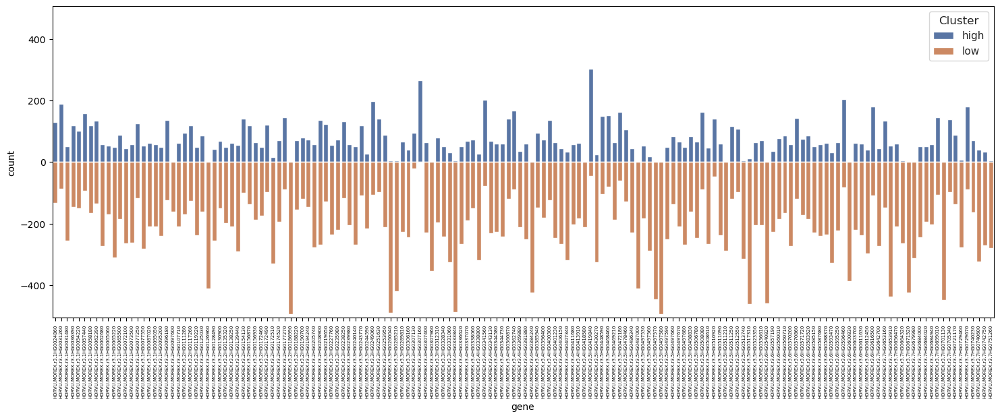

In [5]:
f, ax = plt.subplots(figsize=(18,6))
sns.set_theme(style="whitegrid")
data=cluster_count[cluster_count['Cluster'] != 'mid']
sns.barplot(x='gene', y='count', hue='Cluster', data=data, dodge=False)
plt.ylim(-505, 505)
plt.xticks(rotation=90,fontsize=5)
plt.show()
f.savefig("gene_matrix_cluster_distribution.png",dpi=300,bbox_inches='tight')

In [6]:
## plot the gene coverage values
df_matrix = pd.read_csv("gene_matrix.csv",index_col=0,header=0)
df_matrix.head()

,ENA_name,HORVU.MOREX.r3.1HG0024860,HORVU.MOREX.r3.1HG0031260,HORVU.MOREX.r3.1HG0031480,HORVU.MOREX.r3.1HG0036390,HORVU.MOREX.r3.1HG0054220,HORVU.MOREX.r3.1HG0057440,HORVU.MOREX.r3.1HG0058180,HORVU.MOREX.r3.1HG0062390,HORVU.MOREX.r3.1HG0062680,...,HORVU.MOREX.r3.7HG0699010,HORVU.MOREX.r3.7HG0701130,HORVU.MOREX.r3.7HG0705340,HORVU.MOREX.r3.7HG0721170,HORVU.MOREX.r3.7HG0729460,HORVU.MOREX.r3.7HG0729670,HORVU.MOREX.r3.7HG0740230,HORVU.MOREX.r3.7HG0740600,HORVU.MOREX.r3.7HG0742750,HORVU.MOREX.r3.7HG0751260
0,ERS2903440,0.935491,0.901748,0.001374,0.107184,0.011146,0.115887,0.487823,1.309566,0.782961,...,0.520803,0.0,1.024048,0.646920,1.033514,1.076723,0.692114,0.030689,0.218337,0.966486
1,ERS2903441,0.952896,0.904623,0.001170,0.123464,0.014043,0.136630,0.532475,1.212697,0.604154,...,0.527794,0.0,1.009655,0.619661,1.073435,1.082212,0.574312,0.011703,0.176419,0.929491
2,ERS2903442,0.922124,0.926726,0.003186,0.115221,0.010088,0.114513,0.468142,1.238938,0.759823,...,0.478584,0.0,0.986903,0.601770,1.084602,1.013097,0.609381,0.009381,0.206018,0.913982
3,ERS2903444,0.972762,0.954130,0.001597,0.120309,0.011357,0.143732,0.530565,1.197054,0.637565,...,0.500577,0.0,0.969390,0.683879,1.161388,1.014817,0.620885,0.014196,0.136279,0.942064
4,ERS2903445,0.812351,0.799304,0.001957,0.131333,0.010872,0.098500,0.509459,1.332681,0.957599,...,0.476408,0.0,1.081322,0.731898,1.084584,0.976952,0.662535,0.034790,0.251794,0.976517


In [7]:
melted_matrix = df_matrix.reset_index().melt(id_vars='ENA_name', var_name='gene', value_name='coverage')
melted_matrix.head()

,ENA_name,gene,coverage
0,ERS2903440,index,0.0
1,ERS2903441,index,1.0
2,ERS2903442,index,2.0
3,ERS2903444,index,3.0
4,ERS2903445,index,4.0


In [8]:
df_cluster.head()

,HORVU.MOREX.r3.1HG0024860,HORVU.MOREX.r3.1HG0031260,HORVU.MOREX.r3.1HG0031480,HORVU.MOREX.r3.1HG0036390,HORVU.MOREX.r3.1HG0054220,HORVU.MOREX.r3.1HG0057440,HORVU.MOREX.r3.1HG0058180,HORVU.MOREX.r3.1HG0062390,HORVU.MOREX.r3.1HG0062680,HORVU.MOREX.r3.1HG0065060,...,HORVU.MOREX.r3.7HG0699010,HORVU.MOREX.r3.7HG0701130,HORVU.MOREX.r3.7HG0705340,HORVU.MOREX.r3.7HG0721170,HORVU.MOREX.r3.7HG0729460,HORVU.MOREX.r3.7HG0729670,HORVU.MOREX.r3.7HG0740230,HORVU.MOREX.r3.7HG0740600,HORVU.MOREX.r3.7HG0742750,HORVU.MOREX.r3.7HG0751260
ENA_name,,,,,,,,,,,,,,,,,,,,,
ERS2903440,mid,mid,low,low,mid,mid,low,high,mid,mid,...,high,low,mid,mid,low,high,high,mid,mid,mid
ERS2903441,high,mid,low,mid,high,high,mid,mid,low,mid,...,high,low,mid,mid,mid,high,mid,low,mid,mid
ERS2903442,mid,mid,mid,mid,mid,mid,low,mid,mid,low,...,low,low,mid,low,mid,mid,mid,low,mid,mid
ERS2903444,high,mid,low,mid,mid,high,mid,mid,low,low,...,mid,low,mid,mid,mid,mid,mid,low,low,mid
ERS2903445,low,low,mid,high,mid,low,mid,high,high,high,...,low,low,high,high,mid,low,mid,mid,high,mid


In [9]:
melted_cluster_new = df_cluster.reset_index().melt(id_vars='ENA_name', var_name='gene',value_name='Cluster')
melted_cluster_new.head()

,ENA_name,gene,Cluster
0,ERS2903440,HORVU.MOREX.r3.1HG0024860,mid
1,ERS2903441,HORVU.MOREX.r3.1HG0024860,high
2,ERS2903442,HORVU.MOREX.r3.1HG0024860,mid
3,ERS2903444,HORVU.MOREX.r3.1HG0024860,high
4,ERS2903445,HORVU.MOREX.r3.1HG0024860,low


In [10]:
df_cluster_coverage = melted_cluster_new.merge(melted_matrix,on=['ENA_name','gene'])
df_cluster_coverage.head()

,ENA_name,gene,Cluster,coverage
0,ERS2903440,HORVU.MOREX.r3.1HG0024860,mid,0.935491
1,ERS2903441,HORVU.MOREX.r3.1HG0024860,high,0.952896
2,ERS2903442,HORVU.MOREX.r3.1HG0024860,mid,0.922124
3,ERS2903444,HORVU.MOREX.r3.1HG0024860,high,0.972762
4,ERS2903445,HORVU.MOREX.r3.1HG0024860,low,0.812351


## Filter geno and pheno data, perform ttest

In [11]:
df_all = pd.read_csv("all_experiments.csv",header=0,index_col=0)
df_all.head()

,experiment,trait,pheno_count_with_nan,pheno_count_missing,ENA_name,phenotype_value,gene,genotype_cluster,genotype_value,without_nan_count_high,without_nan_count_low,without_nan_count_mid
0,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903472,49.0,HORVU.MOREX.r3.1HG0024860,high,0.950587,99,76,157
1,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903473,62.0,HORVU.MOREX.r3.1HG0024860,mid,0.940677,99,76,157
2,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903474,55.0,HORVU.MOREX.r3.1HG0024860,high,0.980333,99,76,157
3,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903475,54.0,HORVU.MOREX.r3.1HG0024860,mid,0.936939,99,76,157
4,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903476,55.0,HORVU.MOREX.r3.1HG0024860,mid,0.932741,99,76,157


In [12]:
experiment_list = list(df_all['experiment'].unique())
experiment_list

['2014_NtL_SoP',
 '2014_18Hrs_SoP',
 '2015_TOP1_nan',
 '2015_TOP2_nan',
 '2015_TOP3_nan',
 '2016_NatL_SoP',
 '2016_18Hrs_SoP',
 '2015_nan_GER',
 '2016_nan_GER',
 '2015_nan_KAT',
 '2016_nan_KAT',
 '2015_nan_ESP',
 '2016_nan_ESP',
 '2016_1NI_MER',
 '2016_2Ir_MER']

In [13]:
df_all['experiment'].value_counts()

2016_nan_KAT      252320
2016_nan_ESP      246560
2014_NtL_SoP      245600
2014_18Hrs_SoP    242080
2016_2Ir_MER      224480
2016_1NI_MER      223840
2015_nan_KAT      208480
2015_nan_GER      208000
2015_nan_ESP      205120
2016_nan_GER      200800
2016_NatL_SoP     158880
2016_18Hrs_SoP    153440
2015_TOP3_nan      51680
2015_TOP1_nan      41760
2015_TOP2_nan      28480
Name: experiment, dtype: int64

In [14]:
##check non numeric value in phenotype data
non_numeric_values = []
for index, value in df_all['phenotype_value'].iteritems():
    try:
        float(value)
    except ValueError:
        non_numeric_values.append((index, value))

/tmp/ipykernel_2380399/3369385881.py:3: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df_all['phenotype_value'].iteritems():


In [15]:
len(non_numeric_values)

0

In [16]:
## loop through experiment, trait, and genes, for num_high and num_low both > 0, do ttests and output results
stats_list = ['experiment',
              'trait',
              'gene',
              'num_high',
              'num_low',
              'num_mid',
              't_stat',
              'p_value']

array_2D = []
## loop experiments
for experiment in experiment_list:
    #get experiment data
    df_experiment = df_all[df_all['experiment'] == experiment]
    
    #get trait list
    trait_list = list(df_experiment['trait'].unique())
    
    ## loop traits
    for trait in trait_list:
        df_experiment_trait = df_experiment[df_experiment['trait'] == trait]
        gene_list = list(df_experiment_trait['gene'].unique())
        
        ## loop genes
        for gene in gene_list:
            df_experiment_trait_gene = df_experiment_trait[df_experiment_trait['gene'] == gene]
            num_cluster = len(df_experiment_trait_gene['genotype_cluster'].value_counts())
            
            ## count high and low
            series = df_experiment_trait_gene["genotype_cluster"].value_counts()
            num_high = 0
            num_low = 0
            num_mid = 0
            if 'high' in series.index:
                num_high = series['high'] 
            if 'low' in series.index:
                num_low = series['low']
            if 'mid' in series.index:
                num_low = series['mid']
            ## with low and high data
            if num_high * num_low > 0:
                group1 = df_experiment_trait_gene[df_experiment_trait_gene["genotype_cluster"] == "high"]["phenotype_value"].dropna()
                group2 = df_experiment_trait_gene[df_experiment_trait_gene["genotype_cluster"] == "low"]["phenotype_value"].dropna()
                ## ttests
                t_stat, p_value = ttest_ind(group1, group2)
            else:
                t_stat, p_value = (np.nan, np.nan)
            para_list = [experiment, trait, gene, num_high, num_low, num_mid, t_stat, p_value]
            array_2D.append(para_list)
df_stats = pd.DataFrame(array_2D, columns=stats_list)
df_stats.to_csv("all_experiment_ttests.csv")

/data/tools/miniconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3747: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/tools/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/data/tools/miniconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3747: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/tools/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/data/tools/miniconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3747: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/tools/miniconda3/lib/python3.9/site

## Select target gene, and count trait and trial

In [17]:
df_stats.head()

,experiment,trait,gene,num_high,num_low,num_mid,t_stat,p_value
0,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0024860,68,149,0,-0.209484,0.834342
1,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031260,98,153,0,-0.375799,0.707587
2,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031480,37,134,0,0.959368,0.338720
3,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0036390,85,136,0,0.265646,0.790834
4,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0054220,58,153,0,-2.933254,0.003871


In [18]:
## apply p-value threshold of 0.01, for each gene, count what trait in how many trials were detected
df_stats_filter = df_stats[df_stats['p_value'] <= 0.01]
gene_count_trait = df_stats_filter.groupby(['gene']).trait.agg(['count']).reset_index()
gene_count_trait.columns = ['gene','how_many_trait']
gene_count_trait.head()

,gene,how_many_trait
0,HORVU.MOREX.r3.1HG0024860,1
1,HORVU.MOREX.r3.1HG0031260,9
2,HORVU.MOREX.r3.1HG0054220,2
3,HORVU.MOREX.r3.1HG0058180,1
4,HORVU.MOREX.r3.1HG0062390,1


In [19]:
gene_trait_count_trial = df_stats_filter.groupby(['gene','trait']).experiment.agg(['count']).reset_index()
gene_trait_count_trial.columns = ['gene','what_trait','gene_trait_how_many_trial']
gene_trait_count_trial.head()

,gene,what_trait,gene_trait_how_many_trial
0,HORVU.MOREX.r3.1HG0024860,GrYld,1
1,HORVU.MOREX.r3.1HG0031260,GrYld,1
2,HORVU.MOREX.r3.1HG0031260,TlrNo,1
3,HORVU.MOREX.r3.1HG0031260,ZS49,2
4,HORVU.MOREX.r3.1HG0031260,ZS49PlHt,4


In [20]:
## merge trait count and trial count
df_count = gene_trait_count_trial.merge(gene_count_trait, on='gene')
df_count = df_count[['gene','how_many_trait','what_trait','gene_trait_how_many_trial']]
df_count.head()

,gene,how_many_trait,what_trait,gene_trait_how_many_trial
0,HORVU.MOREX.r3.1HG0024860,1,GrYld,1
1,HORVU.MOREX.r3.1HG0031260,9,GrYld,1
2,HORVU.MOREX.r3.1HG0031260,9,TlrNo,1
3,HORVU.MOREX.r3.1HG0031260,9,ZS49,2
4,HORVU.MOREX.r3.1HG0031260,9,ZS49PlHt,4


In [21]:
df_count['gene'].nunique()

127

## merge 76 genome info to df_count

In [22]:
## merge with data in 76 pangenomes
df_pan=pd.read_csv("merged_gemoma_output_phenology.count", delimiter='\t', header=None)
df_pan.columns=['V3','count','var','type']
df_pan['V3']=df_pan['V3'].str[:-2] + '1'
df_pan['V3'] = df_pan['V3'].str.replace('HORVU.MOREX.r3.HORVU.MOREX.r3.4HG0377280.1','HORVU.MOREX.r3.4HG0377280.1')
df_pan.head()

/tmp/ipykernel_2380399/4034675169.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df_pan['V3'] = df_pan['V3'].str.replace('HORVU.MOREX.r3.HORVU.MOREX.r3.4HG0377280.1','HORVU.MOREX.r3.4HG0377280.1')


,V3,count,var,type
0,HORVU.MOREX.r3.1HG0024860.1,1,10TJ18,D
1,HORVU.MOREX.r3.1HG0031260.1,1,10TJ18,D
2,HORVU.MOREX.r3.1HG0031480.1,1,10TJ18,D
3,HORVU.MOREX.r3.1HG0036390.1,1,10TJ18,D
4,HORVU.MOREX.r3.2HG0119220.1,1,10TJ18,D


In [23]:
df_pan_group = df_pan.groupby(['V3']).agg({'count': ['mean', 'min', 'max','std']})
df_pan_group.columns = df_pan_group.columns.get_level_values(1)
df_pan_group=df_pan_group.reset_index()
df_pan_group['V3'] = df_pan_group['V3'].str.strip()
df_pan_group.head()

,V3,mean,min,max,std
0,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000
1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000
2,HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000
3,HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299
4,HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000


In [24]:
df_pan_group['CNV'] = np.where(df_pan_group['std'] > 0, 'YES', 'NO')
df_pan_group.head()

,V3,mean,min,max,std,CNV
0,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000,NO
1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000,NO
2,HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000,NO
3,HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299,YES
4,HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000,NO


In [25]:
df_pan_group['V3'].str.endswith('.1').value_counts()

True    163
Name: V3, dtype: int64

In [26]:
target_gene = list(df_count['gene'].unique())
target_gene = [x + '.1' for x in target_gene]
df_pan_group_target = df_pan_group[df_pan_group['V3'].isin(target_gene)]
df_pan_group_target['CNV'].value_counts()

NO     75
YES    52
Name: CNV, dtype: int64

In [27]:
df_count.head()

,gene,how_many_trait,what_trait,gene_trait_how_many_trial
0,HORVU.MOREX.r3.1HG0024860,1,GrYld,1
1,HORVU.MOREX.r3.1HG0031260,9,GrYld,1
2,HORVU.MOREX.r3.1HG0031260,9,TlrNo,1
3,HORVU.MOREX.r3.1HG0031260,9,ZS49,2
4,HORVU.MOREX.r3.1HG0031260,9,ZS49PlHt,4


In [28]:
df_pan_group.head()

,V3,mean,min,max,std,CNV
0,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000,NO
1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000,NO
2,HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000,NO
3,HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299,YES
4,HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000,NO


In [29]:
df_count['gene'] = df_count['gene'] + '.1'

In [30]:
df_count_pan_group = df_count.merge(df_pan_group,left_on='gene',right_on='V3',how='left')
df_count_pan_group.head()

,gene,how_many_trait,what_trait,gene_trait_how_many_trial,V3,mean,min,max,std,CNV
0,HORVU.MOREX.r3.1HG0024860.1,1,GrYld,1,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.0,NO
1,HORVU.MOREX.r3.1HG0031260.1,9,GrYld,1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.0,NO
2,HORVU.MOREX.r3.1HG0031260.1,9,TlrNo,1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.0,NO
3,HORVU.MOREX.r3.1HG0031260.1,9,ZS49,2,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.0,NO
4,HORVU.MOREX.r3.1HG0031260.1,9,ZS49PlHt,4,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.0,NO


In [31]:
df_count_pan_group.to_csv("gene_count_trait_and_trail_p01.csv")

## merge 76 genome info to df_stats

In [32]:
df_stats.head()

,experiment,trait,gene,num_high,num_low,num_mid,t_stat,p_value
0,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0024860,68,149,0,-0.209484,0.834342
1,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031260,98,153,0,-0.375799,0.707587
2,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031480,37,134,0,0.959368,0.338720
3,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0036390,85,136,0,0.265646,0.790834
4,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0054220,58,153,0,-2.933254,0.003871


In [33]:
df_stats['gene'] = df_stats['gene'] + '.1'

In [34]:
df_stats_pan_group = df_stats.merge(df_pan_group,left_on='gene',right_on='V3',how='left')
df_stats_pan_group.head()

,experiment,trait,gene,num_high,num_low,num_mid,t_stat,p_value,V3,mean,min,max,std,CNV
0,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0024860.1,68,149,0,-0.209484,0.834342,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000,NO
1,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031260.1,98,153,0,-0.375799,0.707587,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000,NO
2,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031480.1,37,134,0,0.959368,0.338720,HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000,NO
3,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0036390.1,85,136,0,0.265646,0.790834,HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299,YES
4,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0054220.1,58,153,0,-2.933254,0.003871,HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000,NO


In [35]:
df_stats_pan_group.to_csv("all_experiment_ttests_with_pan_info.csv")

## Plot target genes

In [36]:
## target gene, trait, experiment with p-value < 0.01 in df_stats
df_stats.head()

,experiment,trait,gene,num_high,num_low,num_mid,t_stat,p_value
0,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0024860.1,68,149,0,-0.209484,0.834342
1,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031260.1,98,153,0,-0.375799,0.707587
2,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0031480.1,37,134,0,0.959368,0.338720
3,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0036390.1,85,136,0,0.265646,0.790834
4,2014_NtL_SoP,ZS49PlHt,HORVU.MOREX.r3.1HG0054220.1,58,153,0,-2.933254,0.003871


In [37]:
df_all.head()

,experiment,trait,pheno_count_with_nan,pheno_count_missing,ENA_name,phenotype_value,gene,genotype_cluster,genotype_value,without_nan_count_high,without_nan_count_low,without_nan_count_mid
0,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903472,49.0,HORVU.MOREX.r3.1HG0024860,high,0.950587,99,76,157
1,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903473,62.0,HORVU.MOREX.r3.1HG0024860,mid,0.940677,99,76,157
2,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903474,55.0,HORVU.MOREX.r3.1HG0024860,high,0.980333,99,76,157
3,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903475,54.0,HORVU.MOREX.r3.1HG0024860,mid,0.936939,99,76,157
4,2014_NtL_SoP,ZS49PlHt,332,24,ERS2903476,55.0,HORVU.MOREX.r3.1HG0024860,mid,0.932741,99,76,157


In [ ]:
df_all[df_all]

In [38]:
df_all['gene'] = df_all['gene'] + '.1'

In [39]:
df_pan_group.head()

,V3,mean,min,max,std,CNV
0,HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000,NO
1,HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000,NO
2,HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000,NO
3,HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299,YES
4,HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000,NO


In [40]:
gene_with_CNV = df_pan_group[df_pan_group['std'] > 0]['V3'].to_list()

In [41]:
len(gene_with_CNV)

67

In [52]:
df_target_all.trait.unique()

array(['ZS49', 'HrvPlHt', 'ZS91', 'PPD', 'ZS49PlHt', 'RN', 'GrYld',
       'TlrNo', 'PrdGrYld', 'PlntNo'], dtype=object)

In [ ]:
## HrvPlHt to PlHt_Hrv
## ZS49PlHt to PlHt_ZS49
## PrdGrYld to GrYld_Prd
## 

In [55]:
df_target_all = df_all.merge(df_stats,on=['experiment','trait','gene'],how='left')

## filter for gene with CNV in 76 and p_value threshold
df_target_all = df_target_all[(df_target_all['p_value'] <= 0.01) & (df_target_all['gene'].isin(gene_with_CNV))]

##create experiment_trait column
df_target_all['experiment_trait'] = df_target_all['experiment'] + "=" + df_target_all['trait']

## change the experiment_trait column to sort xticklabels
## HrvPlHt to PlHt_Hrv
## ZS49PlHt to PlHt_ZS49
## PrdGrYld to GrYld_Prd
replacement_dict = {'HrvPlHt':'PlHt_Hrv',
                   'ZS49PlHt':'PlHt_ZS49',
                   'PrdGrYld':'GrYld_Prd'}

df_target_all['experiment_trait'] = df_target_all['experiment_trait'].replace(replacement_dict, regex=True)

## remove 'PlnNo' trait from the list
df_target_all = df_target_all[df_target_all['trait'] != 'PlnNo']

## split the experiment_trait and change to trait_experiment
df_split = df_target_all['experiment_trait'].str.split('=', expand=True)
df_target_all['trait_experiment'] = df_split[1] + "=" + df_split[0]
#df_target_all['experiment_trait'] = df_target_all['experiment_trait'].str.replace(r'\(.*?\)', '')
df_target_all.head()

,experiment,trait,pheno_count_with_nan,pheno_count_missing,ENA_name,phenotype_value,gene,genotype_cluster,genotype_value,without_nan_count_high,without_nan_count_low,without_nan_count_mid,num_high,num_low,num_mid,t_stat,p_value,experiment_trait,trait_experiment
53900,2014_NtL_SoP,ZS49,332,24,ERS2903472,77.0,HORVU.MOREX.r3.1HG0077550.1,low,0.490579,173,39,120,36,109,0,-2.720855,0.007094,2014_NtL_SoP=ZS49,ZS49=2014_NtL_SoP
53901,2014_NtL_SoP,ZS49,332,24,ERS2903473,84.0,HORVU.MOREX.r3.1HG0077550.1,low,0.503854,173,39,120,36,109,0,-2.720855,0.007094,2014_NtL_SoP=ZS49,ZS49=2014_NtL_SoP
53902,2014_NtL_SoP,ZS49,332,24,ERS2903474,86.0,HORVU.MOREX.r3.1HG0077550.1,low,0.519314,173,39,120,36,109,0,-2.720855,0.007094,2014_NtL_SoP=ZS49,ZS49=2014_NtL_SoP
53903,2014_NtL_SoP,ZS49,332,24,ERS2903475,89.0,HORVU.MOREX.r3.1HG0077550.1,low,0.486666,173,39,120,36,109,0,-2.720855,0.007094,2014_NtL_SoP=ZS49,ZS49=2014_NtL_SoP
53904,2014_NtL_SoP,ZS49,332,24,ERS2903476,95.0,HORVU.MOREX.r3.1HG0077550.1,low,0.541092,173,39,120,36,109,0,-2.720855,0.007094,2014_NtL_SoP=ZS49,ZS49=2014_NtL_SoP


In [43]:
df_pan_group.set_index('V3',inplace=True)
df_pan_group.head()

,mean,min,max,std,CNV
V3,,,,,
HORVU.MOREX.r3.1HG0024860.1,1.0,1,1,0.000000,NO
HORVU.MOREX.r3.1HG0031260.1,1.0,1,1,0.000000,NO
HORVU.MOREX.r3.1HG0031480.1,1.0,1,1,0.000000,NO
HORVU.MOREX.r3.1HG0036390.1,1.0,0,2,0.163299,YES
HORVU.MOREX.r3.1HG0054220.1,1.0,1,1,0.000000,NO


In [ ]:
############single plot for each gene without coverage maxtrix plots
# Generate the stripplot with x
for GENE in df_target_all['gene'].unique():
    f, ax = plt.subplots()
    sns.despine(bottom=True, left=True)
    sns.set_theme(style="whitegrid")
    
    ################# filter gene data
    df_gene = df_target_all[df_target_all['gene'] == GENE]
    
    ##plot phenotype
    sns.stripplot(ax=ax, data=df_gene, y="phenotype_value", x="trait_experiment", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, zorder=1)
    
    sns.pointplot(ax=ax, data=df_gene, y="phenotype_value", x="trait_experiment", hue="genotype_cluster",
        join=False, dodge=.8 - .8 / 2, palette="dark", markers="d", scale=.75, errorbar='sd' )
    
    # Extract the unique hue categories
    trait_experiments = df_gene['trait_experiment'].unique()
    hue_categories = ['high','low']
    
    # Perform t-test and annotate p-value for each hue category
    for trait_experiment in trait_experiments:
        group1 = df_gene[(df_gene["trait_experiment"] == experiment_trait) & (df_gene["genotype_cluster"] == "high")]["phenotype_value"].dropna()
        group2 = df_gene[(df_gene["trait_experiment"] == experiment_trait) & (df_gene["genotype_cluster"] == "low")]["phenotype_value"].dropna()
        t_stat, p_value = ttest_ind(group1, group2)
        annotation_text = f"p = {p_value:.4f}"
        
        xtick_labels = [tick.get_text() for tick in ax.get_xticklabels()]
        x_pos = xtick_labels.index(experiment_trait)
        y_pos = max(group1.max(), group2.max()) # Adjust the y-position as needed
        y_pos = y_pos * 1.02
        ax.annotate(annotation_text, xy=(x_pos, y_pos), xycoords="data", ha="center")
    
    ## extract min and max in 76 and annotate on plot
    MIN = df_pan_group.loc[GENE,'min']
    MAX = df_pan_group.loc[GENE,'max']
    annotation_text2 = f"CNV in pan:\nmin={MIN:d}\nmax={MAX:d}"
    ax.annotate(annotation_text2, xy= (1.05, 0.7), xycoords='axes fraction')

    ##change yticklabels
    xtick_labels = [tick.get_text() for tick in ax.get_xticklabels()]  
    ax.set_xticklabels(xtick_labels)
    
    # Get the handles and labels. For this example it'll be 2 tuples
    # of length 4 each.
    handles, labels = ax.get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    plt.title(GENE,fontweight='bold',x=0.5,y=1.05)

    plt.xticks(rotation=30,ha='right')
    
    # Display the plot
    sns.despine()
    #plt.show()
    plt.yscale('log')
    #plt.savefig("./plot_pvalue_01_with_CNV/" + GENE + ".png",dpi=300, bbox_inches='tight')
    plt.savefig(GENE + ".png",dpi=300, bbox_inches='tight')
    #plt.close()

In [45]:
sns.color_palette()

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [46]:
colors = sns.color_palette()
my_hue = [colors[0],colors[7],colors[1]]

In [64]:
df_gene_name.dtypes

V1                    object
V3                    object
Chromosome            object
Start Pos              int64
Stop Pos               int64
Putative gene name    object
Annotation_r1_HC      object
GeneID                object
Annotation2           object
dtype: object

In [78]:
## read gene function name and annotation, add to plots
df_gene_name = pd.read_excel('camila_list.xlsx',sheet_name='gene_match',header=0)
for col in df_gene_name.columns:
    if not col.startswith("S"):
        df_gene_name[col] = df_gene_name[col].str.strip()
df_gene_name.drop_duplicates(subset='V3', keep='first')
df_gene_name['V3'] = df_gene_name['V3'].str[:-2] + ".1"
df_gene_name.set_index('V3',inplace=True)
df_gene_name.head()

,V1,Chromosome,Start Pos,Stop Pos,Putative gene name,Annotation_r1_HC,GeneID,Annotation2
V3,,,,,,,,
HORVU.MOREX.r3.1HG0024860.1,HORVU1Hr1G023620,chr1H,104414916,104421730,HvSHP1,MADS-box transcription factor 13,MLOC_57890,Hordeum vulgare subsp. vulgare mRNA for predic...
HORVU.MOREX.r3.1HG0031260.1,HORVU1Hr1G029220,chr1H,162380897,162388573,HvAG2,MADS-box transcription factor 58,MLOC_57700,Hordeum vulgare subsp. vulgare AGAMOUS-like pr...
HORVU.MOREX.r3.1HG0031480.1,HORVU1Hr1G029520,chr1H,165138693,165145596,HvGA2ox5,gibberellin 2-oxidase,AY551433,Hordeum vulgare subsp. vulgare GA 2-oxidase 5 ...
HORVU.MOREX.r3.1HG0036390.1,HORVU1Hr1G034470,chr1H,221407300,221410345,HvABC1,Protein kinase superfamily protein,MLOC_14062,ABC-1 domain-containing protein
HORVU.MOREX.r3.2HG0119220.1,HORVU1Hr1G037570,chr1H,257467732,257469352,HvGID1L2,Acetyl esterase,MLOC_194,Hordeum vulgare subsp. vulgare mRNA for predic...


In [71]:
df_gene_name.shape

(174, 8)

In [79]:
df_gene_name.index

Index(['HORVU.MOREX.r3.1HG0024860.1', 'HORVU.MOREX.r3.1HG0031260.1',
       'HORVU.MOREX.r3.1HG0031480.1', 'HORVU.MOREX.r3.1HG0036390.1',
       'HORVU.MOREX.r3.2HG0119220.1', 'HORVU.MOREX.r3.1HG0054220.1',
       'HORVU.MOREX.r3.1HG0057440.1', 'HORVU.MOREX.r3.1HG0058180.1',
                                 nan, 'HORVU.MOREX.r3.1HG0062390.1',
       ...
       'HORVU.MOREX.r3.7HG0751260.1', 'HORVU.MOREX.r3.2HG0127410.1',
       'HORVU.MOREX.r3.2HG0139440.1', 'HORVU.MOREX.r3.6HG0603700.1',
                                 nan, 'HORVU.MOREX.r3.7HG0679980.1',
       'HORVU.MOREX.r3.7HG0684940.1', 'HORVU.MOREX.r3.7HG0740600.1',
       'HORVU.MOREX.r3.6HG0600830.1', 'HORVU.MOREX.r3.7HG0684000.1'],
      dtype='object', name='V3', length=174)

In [82]:
p_value

nan

In [86]:
###### add coverage matrix in subplots and plot only low and mid for phenotype
# Generate the stripplot with x
for GENE in df_target_all['gene'].unique():
    f, axes = plt.subplots(1,2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})
    sns.despine(bottom=True, left=True)
    sns.set_theme(style="whitegrid")
    color_map = {'low':colors[0],'mid':colors[2],'high':colors[1]}
    
    ################# filter gene data
    df_gene = df_target_all[df_target_all['gene'] == GENE]
    df_gene2 = df_gene[df_gene['genotype_cluster'] != 'high'] ## to hide mid cluster
    
    ## get xticklabels and sort and use as order in plot
    sorted_xlabels = sorted(df_gene2['trait_experiment'].unique())
    
    ###### plot phenotype
    sns.stripplot(ax=axes[0], data=df_gene2, y="phenotype_value", x="trait_experiment", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, size=4, zorder=1, palette=color_map, order=sorted_xlabels ) ##  palette=color_map
    
    sns.pointplot(ax=axes[0], data=df_gene2, y="phenotype_value", x="trait_experiment", hue="genotype_cluster", order=sorted_xlabels,
                    join=False, dodge=0.4, markers="d", scale=.7, errorbar='sd',errwidth=0.9, palette=color_map)  ## palette=color_map
    
    # Extract the unique hue categories
    trait_experiments = df_gene['trait_experiment'].unique()
    
    # Perform t-test and annotate p-value for each hue category
    for trait_experiment in trait_experiments:
        group1 = df_gene2[(df_gene2["trait_experiment"] == trait_experiment) & (df_gene2["genotype_cluster"] == "mid")]["phenotype_value"].dropna()
        group2 = df_gene2[(df_gene2["trait_experiment"] == trait_experiment) & (df_gene2["genotype_cluster"] == "low")]["phenotype_value"].dropna()
        t_stat, p_value = ttest_ind(group1, group2)
        annotation_text = f"p={p_value:.4f}"
        
        xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()]
        x_pos = xtick_labels.index(trait_experiment)
        y_pos = max(group1.max(), group2.max()) # Adjust the y-position as needed
        y_pos = y_pos * 1.08
        axes[0].annotate(annotation_text, xy=(x_pos, y_pos), xycoords="data", ha="left",fontsize=10, rotation=25)
    
    ## extract min and max in 76 and annotate on plot
    MIN = df_pan_group.loc[GENE,'min']
    MAX = df_pan_group.loc[GENE,'max']
    annotation_text2 = f"CNV in pan: min={MIN:d}, max={MAX:d}"
    axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    

    ##change xticklabels
    xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()] 
    axes[0].set_xticklabels(xtick_labels, rotation = 40, ha='right', fontsize=10)
    
    #xticklabels color
    for i in np.arange(0,len(xtick_labels)):
        if "GrYld" in xtick_labels[i]:
            color=colors[3]
            t=axes[0].xaxis.get_ticklabels()[i]
            t.set_color(color)
        elif "PlHt" in xtick_labels[i]:
            color=colors[4]
            t=axes[0].xaxis.get_ticklabels()[i]
            t.set_color(color)
            
    
    # Get the handles and labels. For this example it'll be 2 tuples
    # of length 4 each.
    handles, labels = axes[0].get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    legend0 = axes[0].legend(handles[0:2], labels[0:2], bbox_to_anchor=(0.5, 1.15), ncol=2, borderaxespad=0.)  ## change depending one how many clusters
    ### ANNOTATE TITLE TO INCLUDE GENE NAME
    axes[0].set_title(GENE,fontweight='bold',x=0.5,y=1.16)
    GENE_name = df_gene_name.loc[GENE,'Putative gene name']
    GENE_func = df_gene_name.loc[GENE,'Annotation_r1_HC']
    annotation_text3 = f"({GENE_name}): {GENE_func}"
    axes[0].annotate(annotation_text3, xy= (0.7, 1.18), xycoords='axes fraction')
    axes[0].set_yscale('log')
    
    ########## create the second axes
    #### plot genotype
    sns.stripplot(ax=axes[1], data=df_gene, y="genotype_value", x="trait_experiment", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, zorder=1,size=3, palette=color_map, order=sorted_xlabels) ## palette=color_map
    
    # sns.pointplot(ax=axes[1], data=df_gene, y="genotype_value", x="trait_experiment", hue="genotype_cluster",
    #     join=False, dodge=0.4, palette="dark", markers="d", scale=.75, errorbar=None)
    
    # annotation_text3 = f"CNV in 502 barley samples\n (read coverage depth)"
    # axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    
    axes[1].set_title("CNV in 502 barley samples\n (read coverage depth)",x=0.5,y=1)
    axes[1].legend([],frameon=False)
    axes[1].set_xticklabels([])
    
    ###################### Display the plot
    sns.despine()
    plt.savefig("./plot_pvalue_01_with_CNV_3kmeans_plot2_with_function_low_mid/" + GENE + ".png",dpi=300, bbox_inches='tight')
    plt.close()

/tmp/ipykernel_2380399/1049770904.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1,2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})


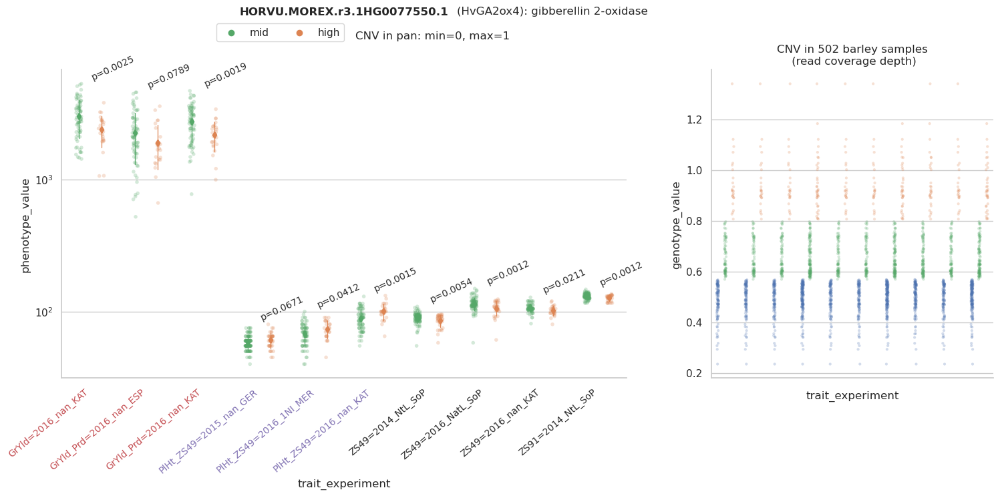

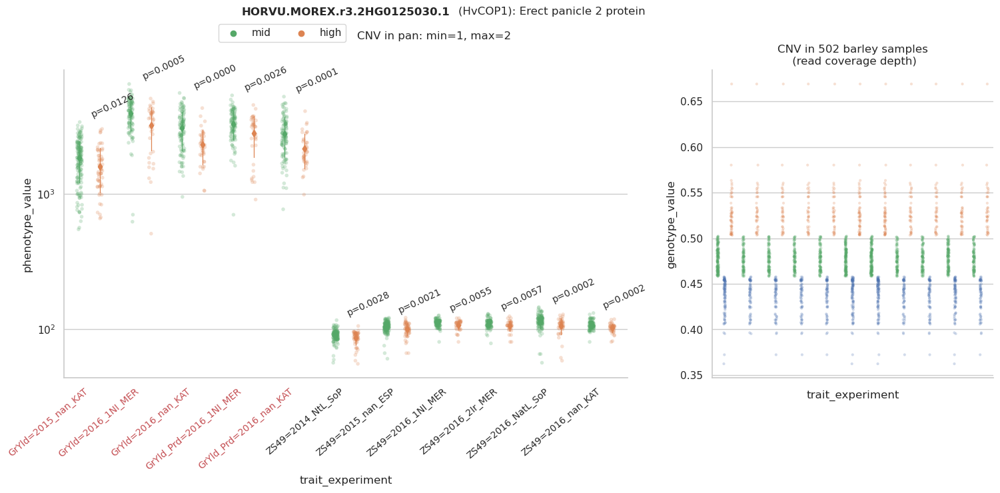

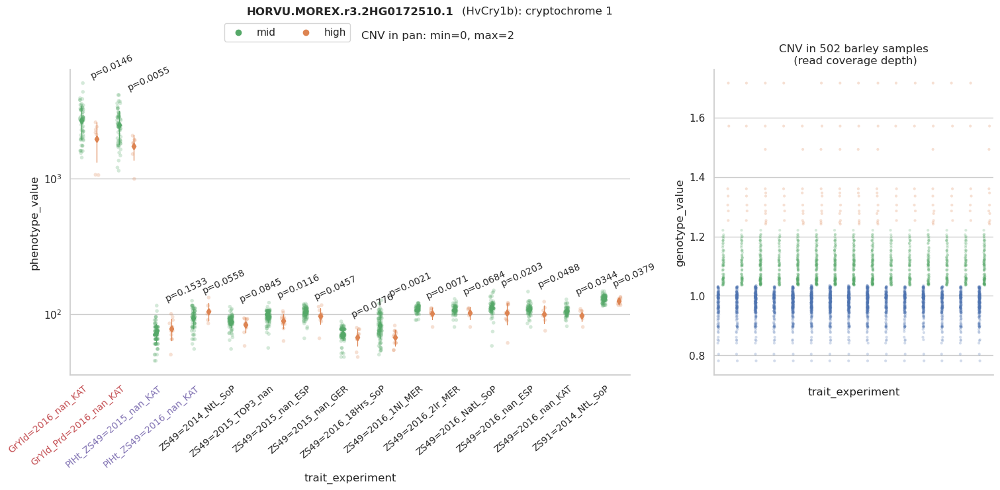

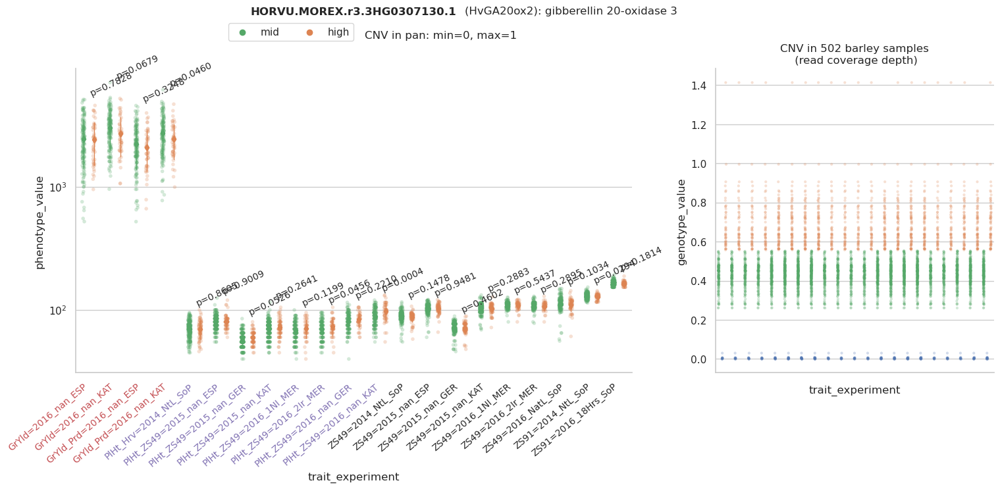

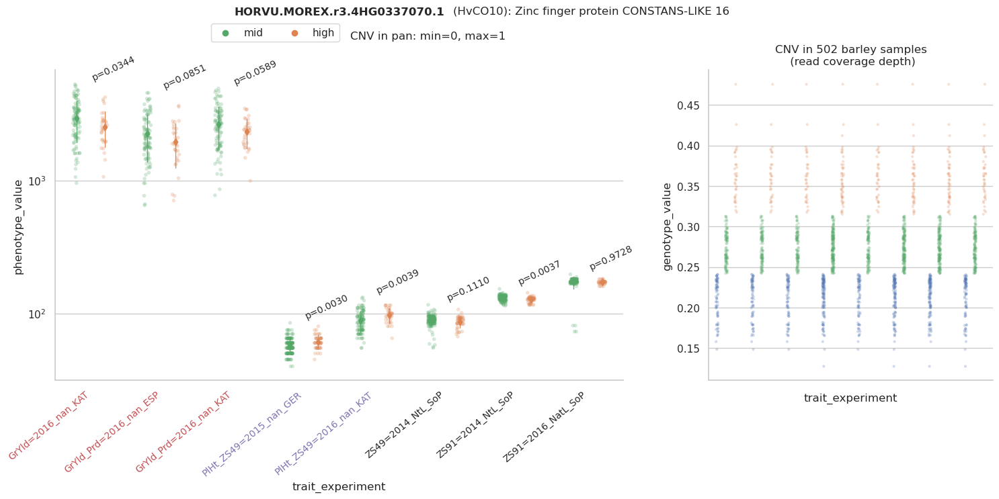

...

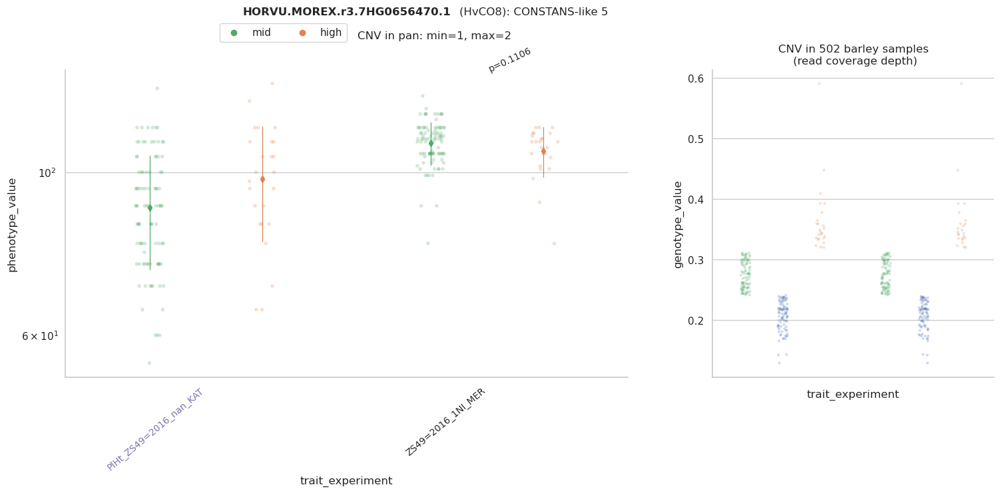

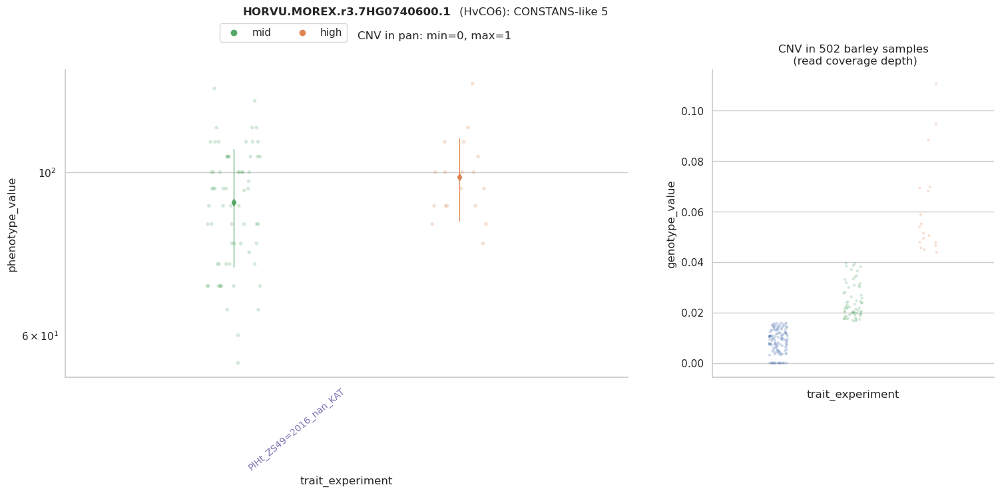

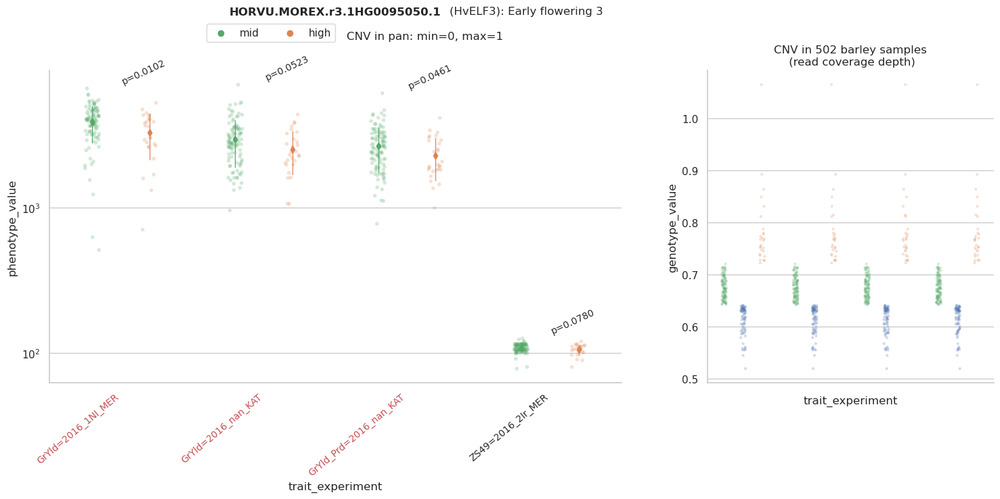

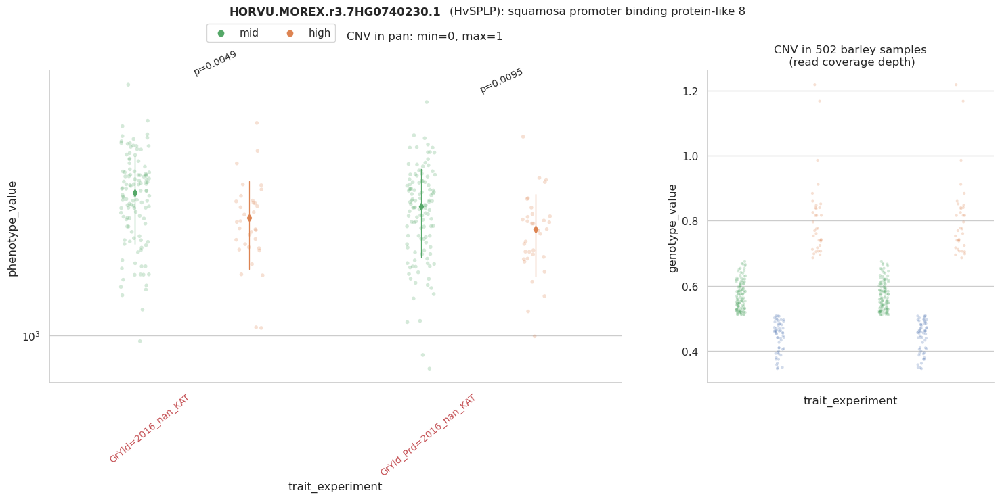

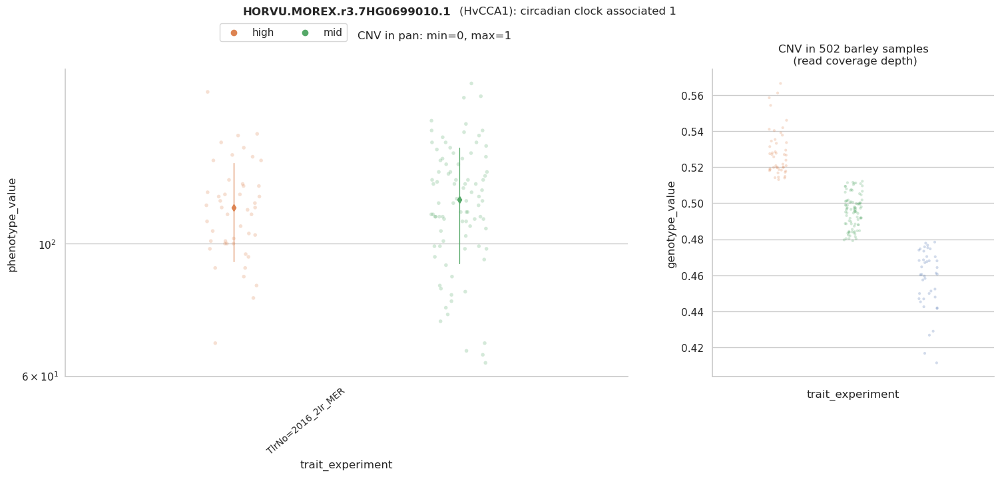

In [87]:
###### add coverage matrix in subplots and plot only low and high for phenotype
# Generate the stripplot with x
for GENE in df_target_all['gene'].unique():
    f, axes = plt.subplots(1,2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})
    sns.despine(bottom=True, left=True)
    sns.set_theme(style="whitegrid")
    color_map = {'low':colors[0],'mid':colors[2],'high':colors[1]}
    
    ################# filter gene data
    df_gene = df_target_all[df_target_all['gene'] == GENE]
    df_gene2 = df_gene[df_gene['genotype_cluster'] != 'low'] ## to hide mid cluster
    
    ## get xticklabels and sort and use as order in plot
    sorted_xlabels = sorted(df_gene2['trait_experiment'].unique())
    
    ###### plot phenotype
    sns.stripplot(ax=axes[0], data=df_gene2, y="phenotype_value", x="trait_experiment", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, size=4, zorder=1, palette=color_map, order=sorted_xlabels ) ##  palette=color_map
    
    sns.pointplot(ax=axes[0], data=df_gene2, y="phenotype_value", x="trait_experiment", hue="genotype_cluster", order=sorted_xlabels,
                    join=False, dodge=0.4, markers="d", scale=.7, errorbar='sd',errwidth=0.9, palette=color_map)  ## palette=color_map
    
    # Extract the unique hue categories
    trait_experiments = df_gene['trait_experiment'].unique()
    
    # Perform t-test and annotate p-value for each hue category
    for trait_experiment in trait_experiments:
        group1 = df_gene2[(df_gene2["trait_experiment"] == trait_experiment) & (df_gene2["genotype_cluster"] == "mid")]["phenotype_value"].dropna()
        group2 = df_gene2[(df_gene2["trait_experiment"] == trait_experiment) & (df_gene2["genotype_cluster"] == "high")]["phenotype_value"].dropna()
        t_stat, p_value = ttest_ind(group1, group2)
        annotation_text = f"p={p_value:.4f}"
        
        xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()]
        x_pos = xtick_labels.index(trait_experiment)
        y_pos = max(group1.max(), group2.max()) # Adjust the y-position as needed
        y_pos = y_pos * 1.08
        axes[0].annotate(annotation_text, xy=(x_pos, y_pos), xycoords="data", ha="left",fontsize=10, rotation=25)
    
    ## extract min and max in 76 and annotate on plot
    MIN = df_pan_group.loc[GENE,'min']
    MAX = df_pan_group.loc[GENE,'max']
    annotation_text2 = f"CNV in pan: min={MIN:d}, max={MAX:d}"
    axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    

    ##change xticklabels
    xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()] 
    axes[0].set_xticklabels(xtick_labels, rotation = 40, ha='right', fontsize=10)
    
    #xticklabels color
    for i in np.arange(0,len(xtick_labels)):
        if "GrYld" in xtick_labels[i]:
            color=colors[3]
            t=axes[0].xaxis.get_ticklabels()[i]
            t.set_color(color)
        elif "PlHt" in xtick_labels[i]:
            color=colors[4]
            t=axes[0].xaxis.get_ticklabels()[i]
            t.set_color(color)
            
    
    # Get the handles and labels. For this example it'll be 2 tuples
    # of length 4 each.
    handles, labels = axes[0].get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    legend0 = axes[0].legend(handles[0:2], labels[0:2], bbox_to_anchor=(0.5, 1.15), ncol=2, borderaxespad=0.)  ## change depending one how many clusters
    ### ANNOTATE TITLE TO INCLUDE GENE NAME
    axes[0].set_title(GENE,fontweight='bold',x=0.5,y=1.16)
    GENE_name = df_gene_name.loc[GENE,'Putative gene name']
    GENE_func = df_gene_name.loc[GENE,'Annotation_r1_HC']
    annotation_text3 = f"({GENE_name}): {GENE_func}"
    axes[0].annotate(annotation_text3, xy= (0.7, 1.18), xycoords='axes fraction')
    axes[0].set_yscale('log')
    
    ########## create the second axes
    #### plot genotype
    sns.stripplot(ax=axes[1], data=df_gene, y="genotype_value", x="trait_experiment", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, zorder=1,size=3, palette=color_map, order=sorted_xlabels) ## palette=color_map
    
    # sns.pointplot(ax=axes[1], data=df_gene, y="genotype_value", x="trait_experiment", hue="genotype_cluster",
    #     join=False, dodge=0.4, palette="dark", markers="d", scale=.75, errorbar=None)
    
    # annotation_text3 = f"CNV in 502 barley samples\n (read coverage depth)"
    # axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    
    axes[1].set_title("CNV in 502 barley samples\n (read coverage depth)",x=0.5,y=1)
    axes[1].legend([],frameon=False)
    axes[1].set_xticklabels([])
    
    ###################### Display the plot
    sns.despine()
    plt.savefig("./plot_pvalue_01_with_CNV_3kmeans_plot2_with_function/" + GENE + ".png",dpi=300, bbox_inches='tight')

/tmp/ipykernel_2380399/2634353766.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axes = plt.subplots(1,2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})


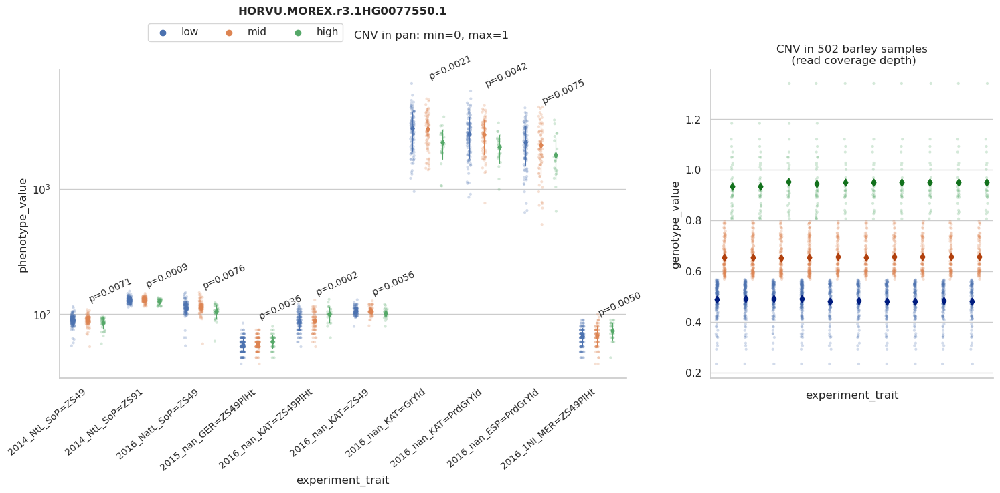

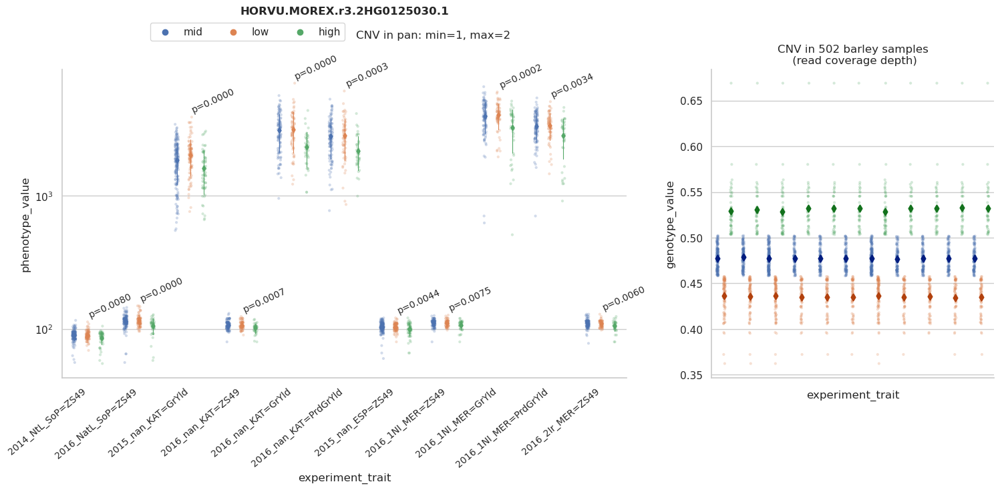

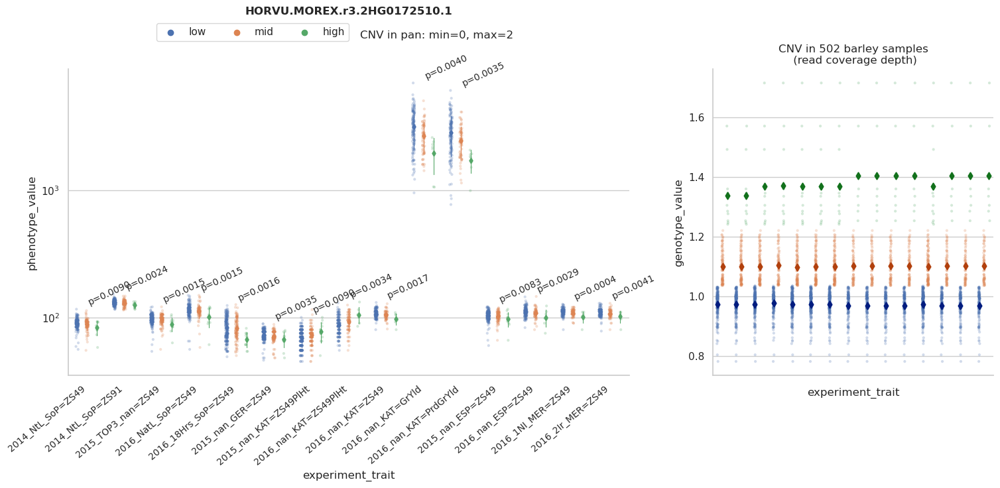

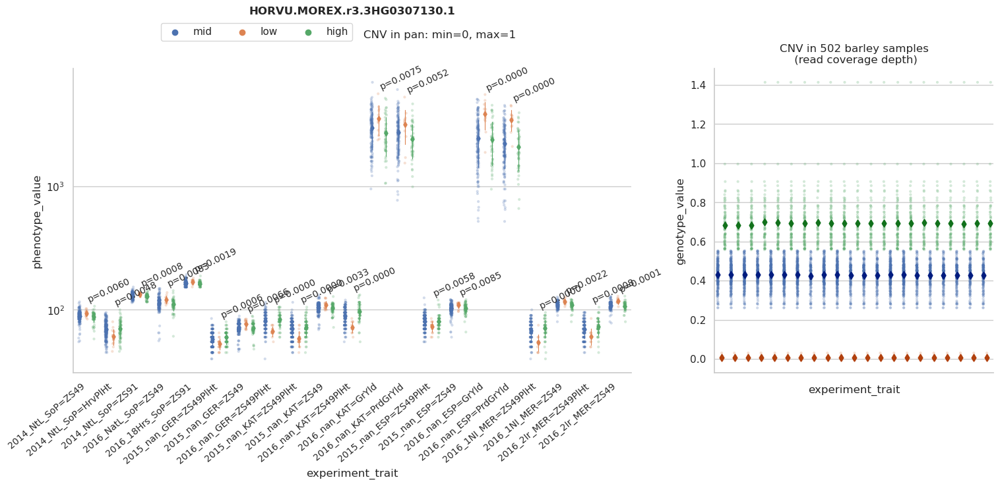

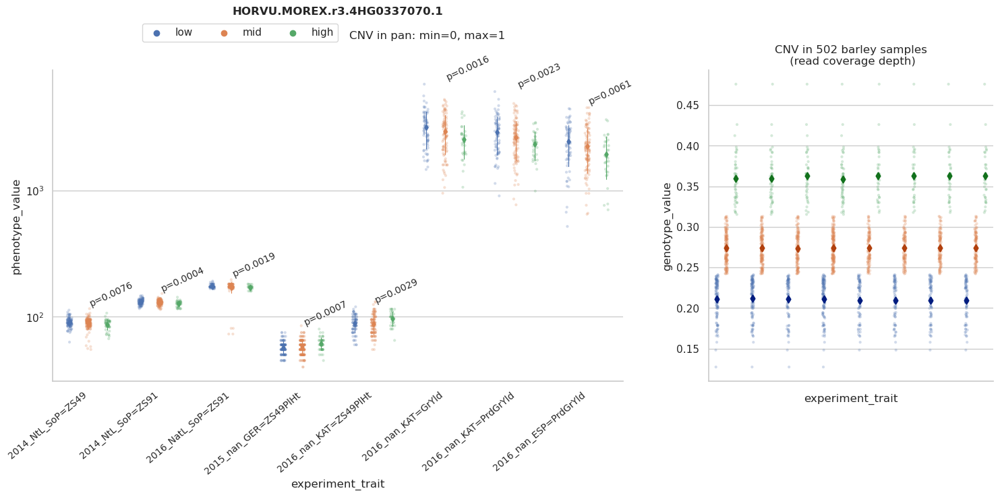

...

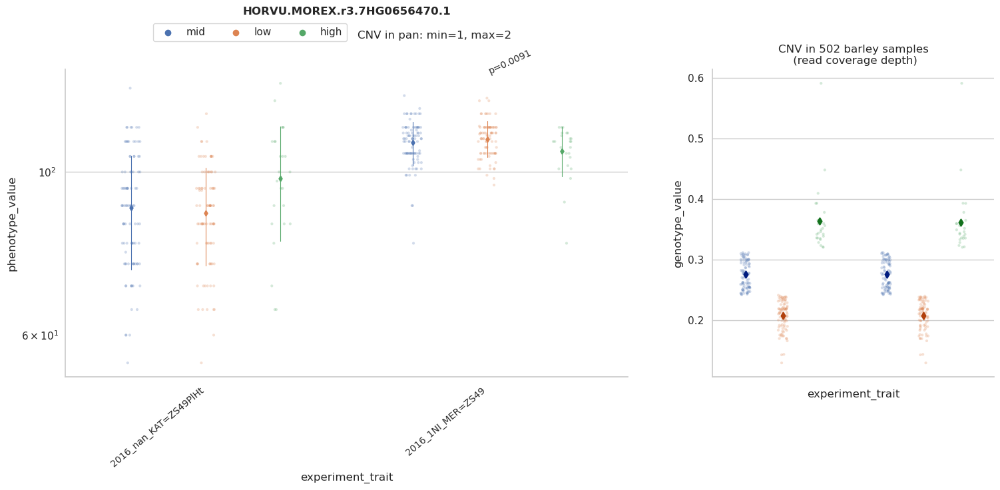

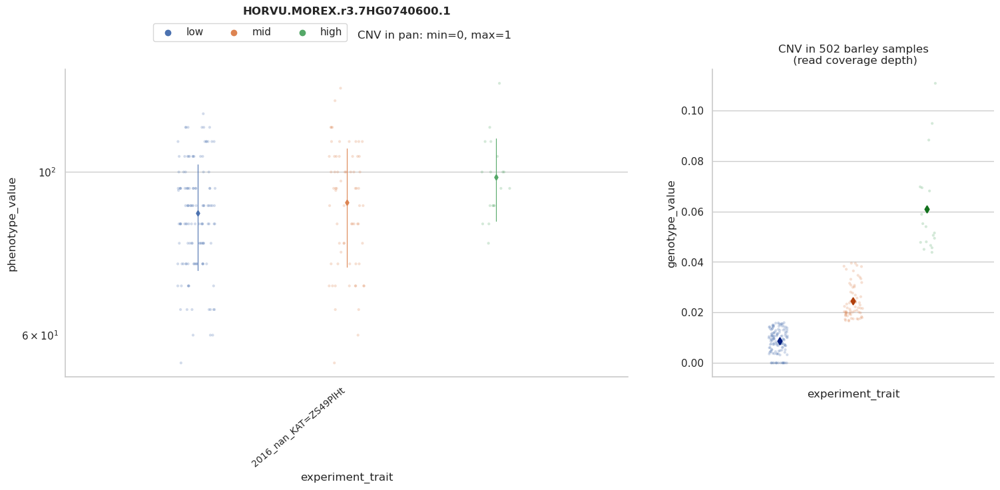

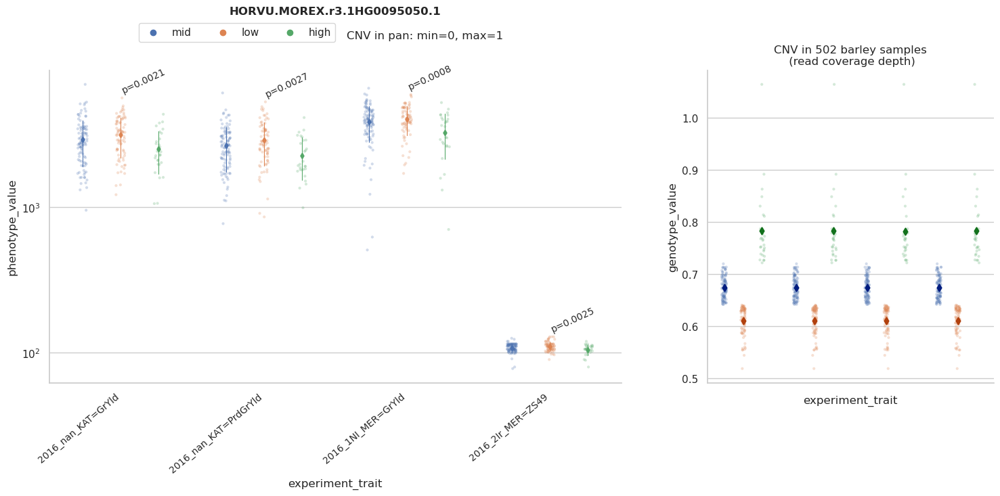

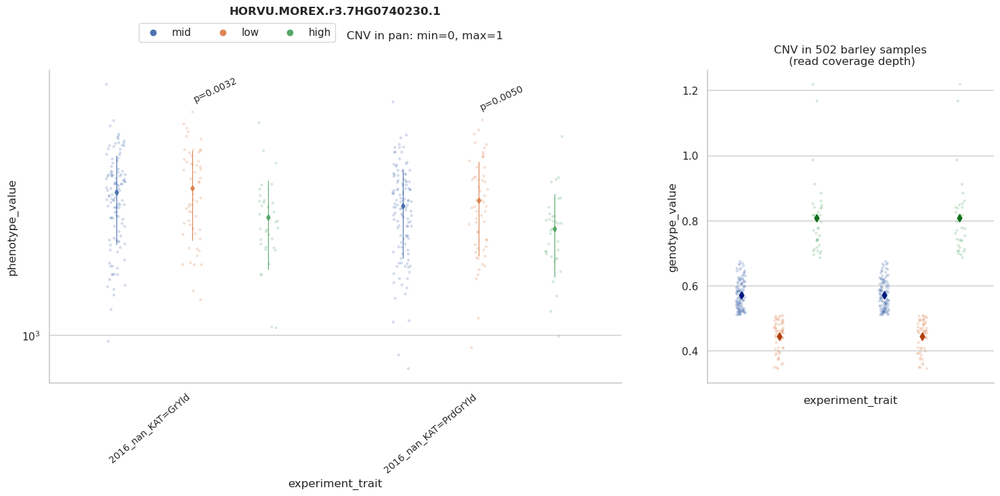

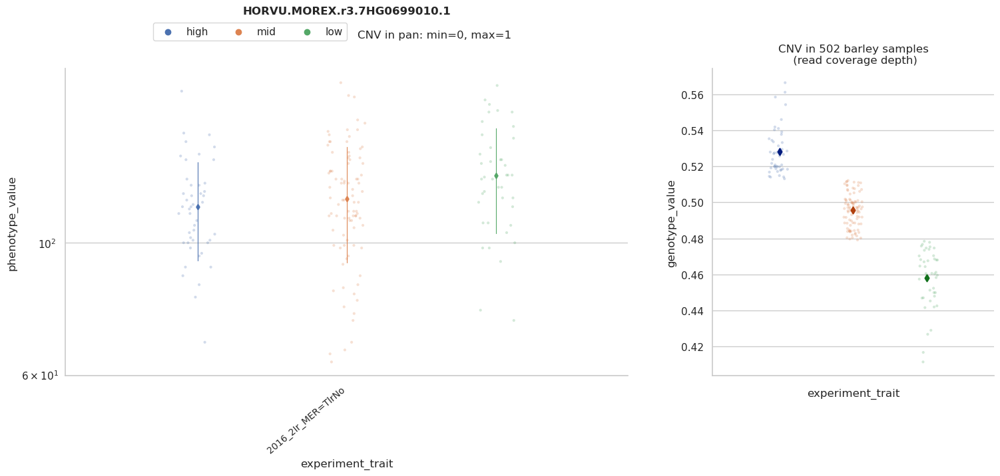

In [48]:
###### try adding coverage matrix in subplots
# Generate the stripplot with x
for GENE in df_target_all['gene'].unique():
    f, axes = plt.subplots(1,2, figsize=(18, 6), gridspec_kw={'width_ratios': [2, 1]})
    sns.despine(bottom=True, left=True)
    sns.set_theme(style="whitegrid")
    color_map = {'low':colors[0],'mid':colors[2],'high':colors[1]}
    
    ################# filter gene data
    df_gene = df_target_all[df_target_all['gene'] == GENE]
    #df_gene2 = df_gene[df_gene['genotype_cluster'] != 'mid'] ## to hide mid cluster
    
    ###### plot phenotype
    sns.stripplot(ax=axes[0], data=df_gene, y="phenotype_value", x="experiment_trait", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, size=3, zorder=1) ##  palette=color_map
    
    sns.pointplot(ax=axes[0], data=df_gene, y="phenotype_value", x="experiment_trait", hue="genotype_cluster",
                    join=False, dodge=0.53, markers="d", scale=.6, errorbar='sd',errwidth=0.8)  ## palette=color_map
    
    # Extract the unique hue categories
    experiment_traits = df_gene['experiment_trait'].unique()
    hue_categories = ['high','low']
    
    # Perform t-test and annotate p-value for each hue category
    for experiment_trait in experiment_traits:
        group1 = df_gene[(df_gene["experiment_trait"] == experiment_trait) & (df_gene["genotype_cluster"] == "high")]["phenotype_value"].dropna()
        group2 = df_gene[(df_gene["experiment_trait"] == experiment_trait) & (df_gene["genotype_cluster"] == "low")]["phenotype_value"].dropna()
        t_stat, p_value = ttest_ind(group1, group2)
        annotation_text = f"p={p_value:.4f}"
        
        xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()]
        x_pos = xtick_labels.index(experiment_trait)
        y_pos = max(group1.max(), group2.max()) # Adjust the y-position as needed
        y_pos = y_pos * 1.08
        axes[0].annotate(annotation_text, xy=(x_pos, y_pos), xycoords="data", ha="left",fontsize=10, rotation=25)
    
    ## extract min and max in 76 and annotate on plot
    MIN = df_pan_group.loc[GENE,'min']
    MAX = df_pan_group.loc[GENE,'max']
    annotation_text2 = f"CNV in pan: min={MIN:d}, max={MAX:d}"
    axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    

    ##change xticklabels
    xtick_labels = [tick.get_text() for tick in axes[0].get_xticklabels()] 
    axes[0].set_xticklabels(xtick_labels, rotation = 40, ha='right', fontsize=10)
    
    # Get the handles and labels. For this example it'll be 2 tuples
    # of length 4 each.
    handles, labels = axes[0].get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    legend0 = axes[0].legend(handles[0:3], labels[0:3], bbox_to_anchor=(0.5, 1.15), ncol=3, borderaxespad=0.)  ## change depending one how many clusters
    axes[0].set_title(GENE,fontweight='bold',x=0.5,y=1.16)
    axes[0].set_yscale('log')
    
    ########## create the second axes
    #### plot genotype
    sns.stripplot(ax=axes[1], data=df_gene, y="genotype_value", x="experiment_trait", hue="genotype_cluster", jitter=True, dodge=True,
                      alpha=.25, zorder=1,size=3) ## palette=color_map
    
    sns.pointplot(ax=axes[1], data=df_gene, y="genotype_value", x="experiment_trait", hue="genotype_cluster",
        join=False, dodge=0.525, palette="dark", markers="d", scale=.75, errorbar=None)
    
    # annotation_text3 = f"CNV in 502 barley samples\n (read coverage depth)"
    # axes[0].annotate(annotation_text2, xy= (0.52, 1.1), xycoords='axes fraction')
    
    axes[1].set_title("CNV in 502 barley samples\n (read coverage depth)",x=0.5,y=1)
    axes[1].legend([],frameon=False)
    axes[1].set_xticklabels([])
    
    ###################### Display the plot
    sns.despine()
    plt.savefig("./plot_pvalue_01_with_CNV_3kmeans/" + GENE + ".png",dpi=300, bbox_inches='tight')
    #plt.savefig(GENE + ".png",dpi=300, bbox_inches='tight')